# Exploratory Analysis of Gesture Images
## Importing Dependencies

In [19]:
import sys
import os

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "..")))  # Add src/ to sys.path to import modules (e.g. utils)

import string
import random
import numpy as np

import torch
import torchvision.transforms as transforms

from src.utils import io, landmarks, visualization, transform_utils

In [2]:
data_dir = os.path.abspath(os.path.join(os.getcwd(), "..", "data"))

In [3]:
reports_dir = os.path.abspath(os.path.join(os.getcwd(), "..", "reports", "data_visualization"))

In [4]:
synthetic_train_data_dir = os.path.join(data_dir, "Train_Alphabet")
synthetic_test_data_dir = os.path.join(data_dir, "Test_Alphabet")

In [5]:
# List of all the letters in the ASL alphabet and other gestures
signs = list(string.ascii_uppercase)
signs.remove("Z")  # Remove 'Z' as it requires movement.
# Keep 'J' despite its movement, since a static 'J' gesture 
# remains valid and is not easily confused with other gestures.
signs.append("nothing")  # Add a class for 'nothing' (background without a gesture)

# Number of signs
num_signs = len(signs)

class_to_idx = {signs[i]: i for i in range(num_signs)}
print(class_to_idx)

{'A': 0, 'B': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'J': 9, 'K': 10, 'L': 11, 'M': 12, 'N': 13, 'O': 14, 'P': 15, 'Q': 16, 'R': 17, 'S': 18, 'T': 19, 'U': 20, 'V': 21, 'W': 22, 'X': 23, 'Y': 24, 'nothing': 25}


## Utility Functions

In [6]:
def get_random_images(image_paths, n=4):
    """
    Get a random sample of images from the given list of image paths.
    """
    random_images = random.sample(image_paths, n)
    return [img_path for img_path in random_images]

## Dataset Overview: Visualizing Sample Images


In [7]:
synthetic_train_filenames_dict = {}

for class_name in signs[:-1]:
    filenames = io.get_dir_filenames(synthetic_train_data_dir, class_name)
    synthetic_train_filenames_dict[class_name] = filenames
    total_num = len(filenames)

Class: A
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


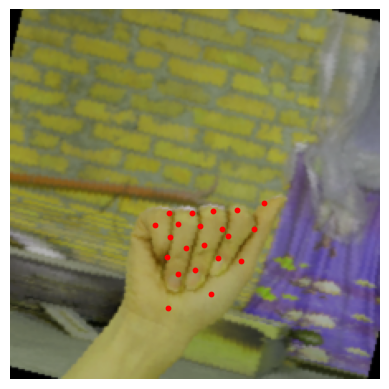

Class: B
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


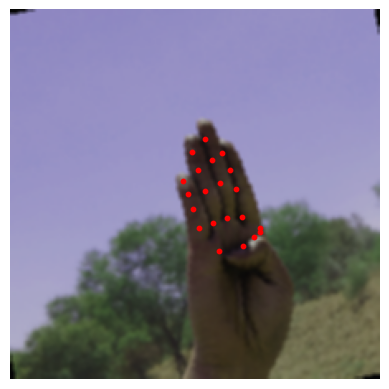

Class: C
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


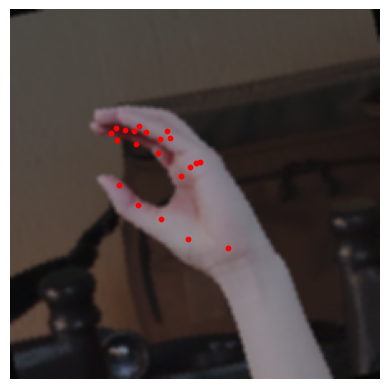

Class: D
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


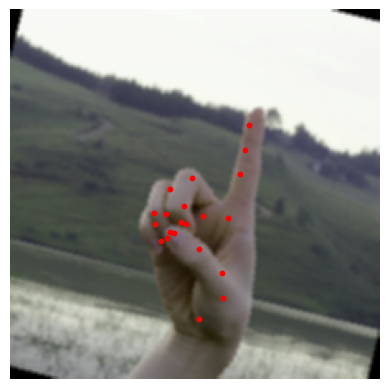

Class: E
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


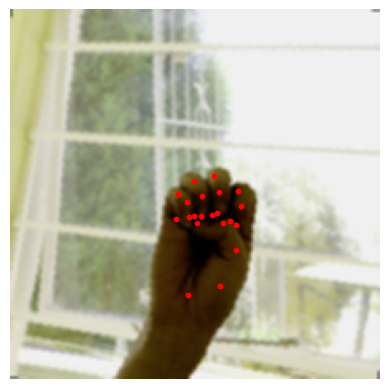

Class: F
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


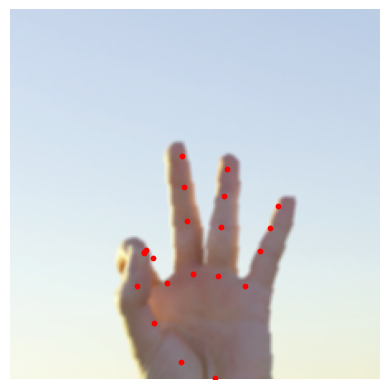

Class: G
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


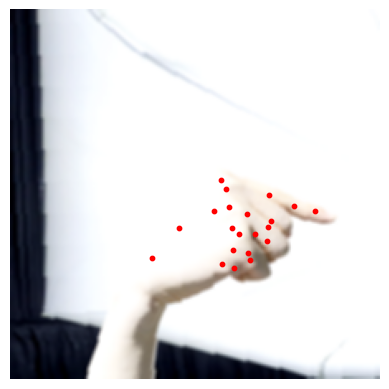

Class: H
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


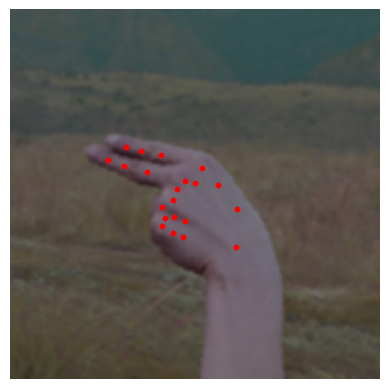

Class: I
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


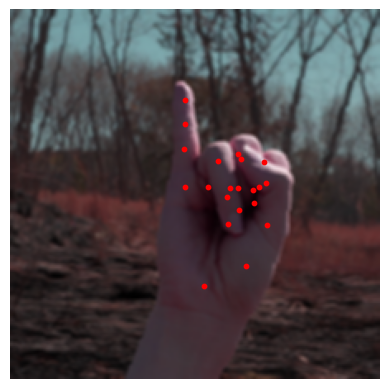

Class: J
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


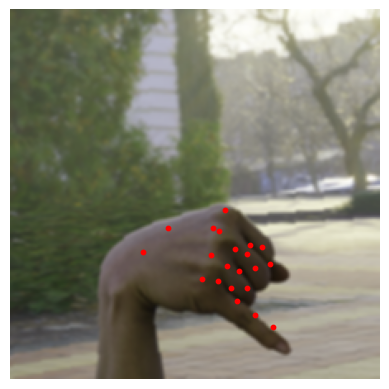

Class: K
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


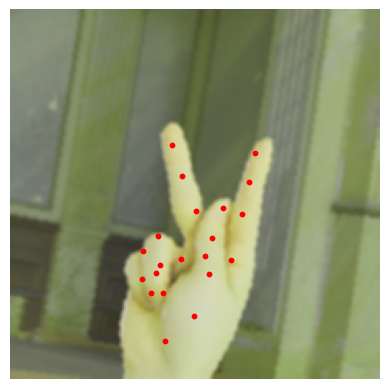

Class: L
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


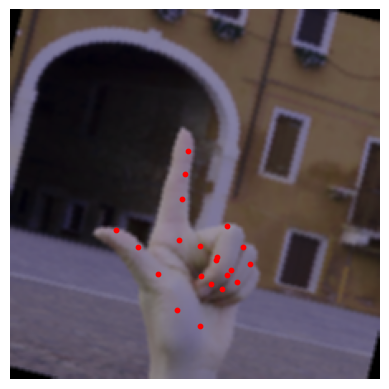

Class: M
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


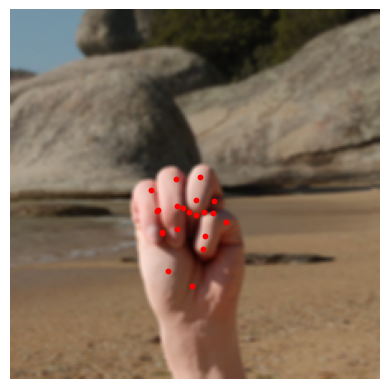

Class: N
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


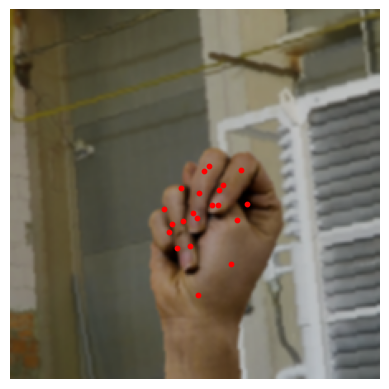

Class: O
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


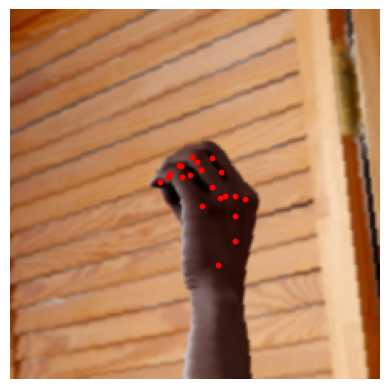

Class: P
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


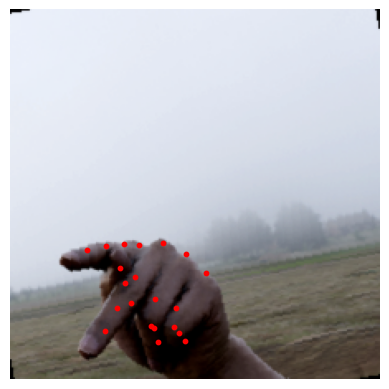

Class: Q
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


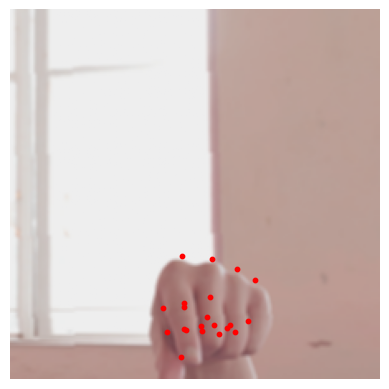

Class: R
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


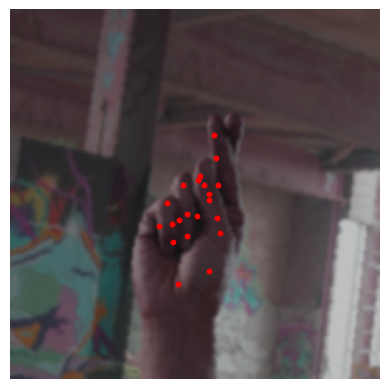

Class: S
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


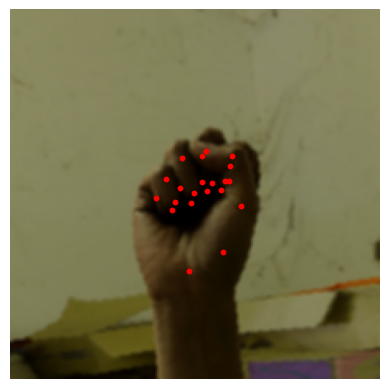

Class: T
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


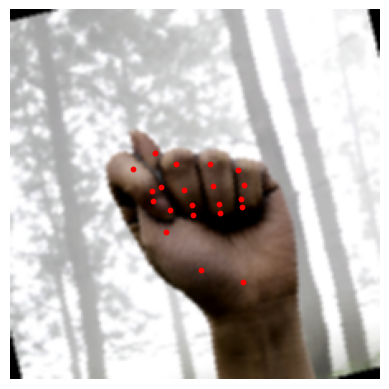

Class: U
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


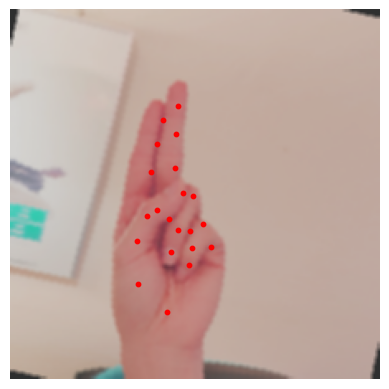

Class: V
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


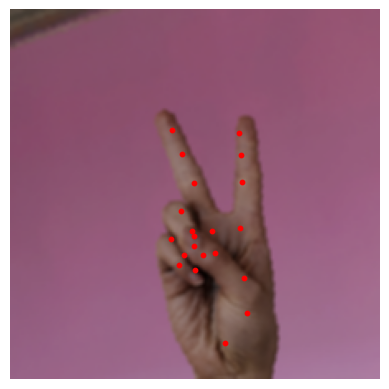

Class: W
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


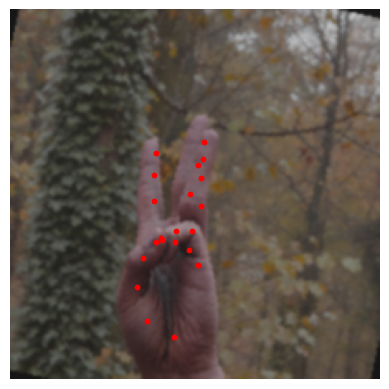

Class: X
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


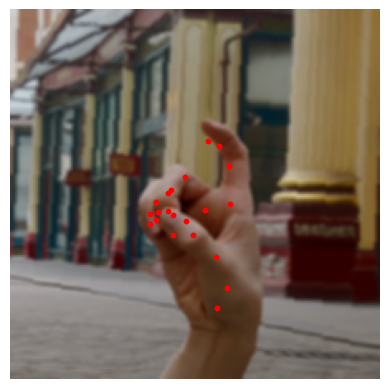

Class: Y
Image shape: torch.Size([3, 224, 224]), Landmarks shape: torch.Size([21, 3])


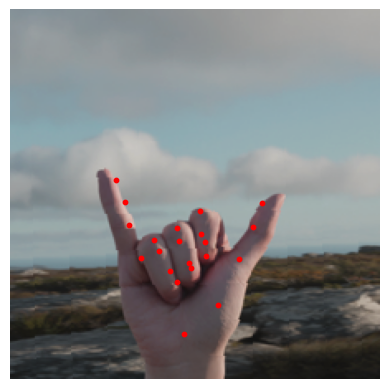

In [ ]:
# Display a random augmented sample of images from each class
custom_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop((224, 224)),
    transforms.ColorJitter(brightness=0.2, contrast=0.3, saturation=0.2, hue=0.1),
    transforms.GaussianBlur(kernel_size=3, sigma=(0.2, 2.)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

for key, value in synthetic_train_filenames_dict.items():
    image_path = random.choice(value)
    
    image = io.read_image(image_path)
    landmarks_ = landmarks.get_img_hand_landmarks(image_path)
    landmark_coordinates = landmarks.get_landmark_coordinates(landmarks_)
    
    print(f"Class: {key}")
    
    image, landmarks_ = transform_utils.transform_image_and_landmarks(image, landmarks=landmark_coordinates, transforms=custom_transforms, normalize=False)
        
    print(f"Image shape: {image.shape}, Landmarks shape: {landmarks_.shape}")
    
    visualization.display_transformed_image(image, landmarks=landmarks_)

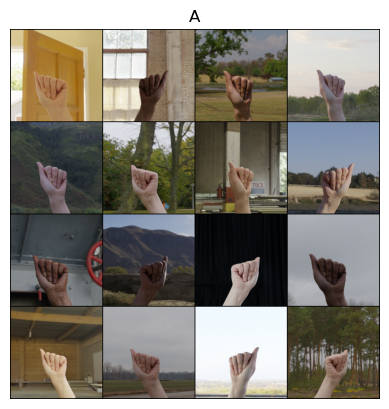

Figure saved ✅


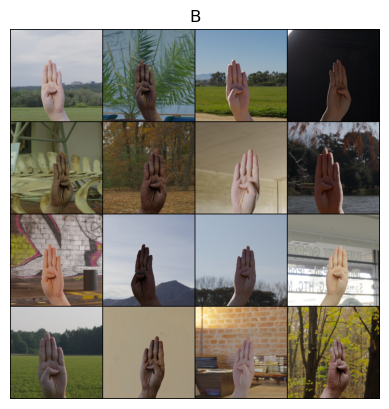

Figure saved ✅


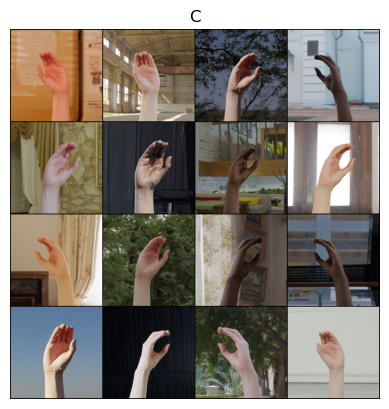

Figure saved ✅


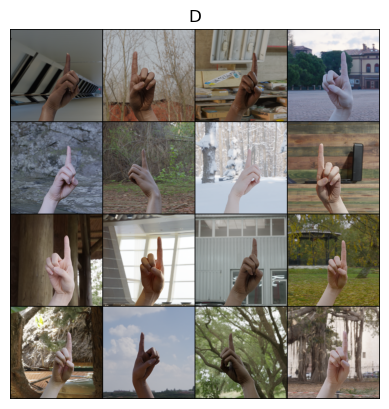

Figure saved ✅


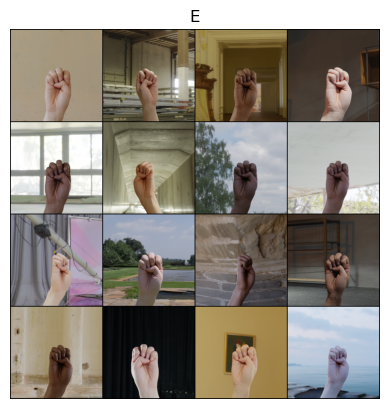

Figure saved ✅


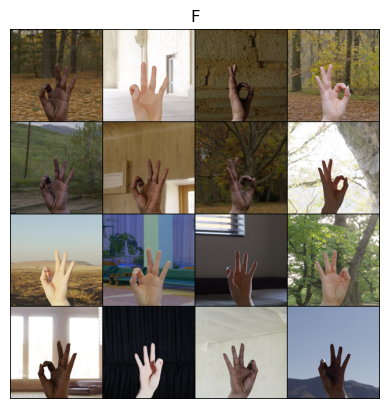

Figure saved ✅


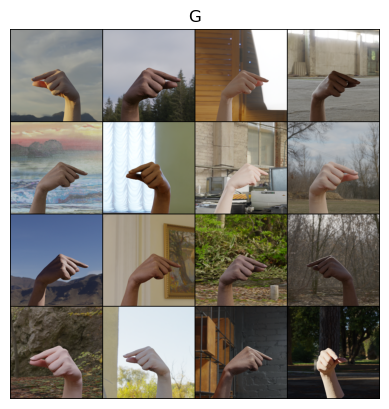

Figure saved ✅


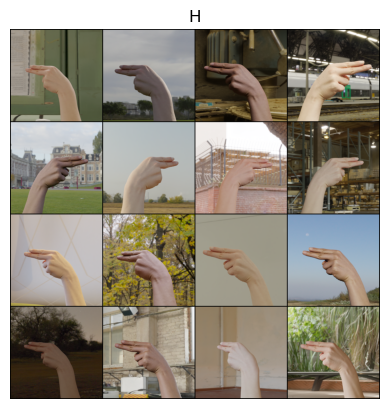

Figure saved ✅


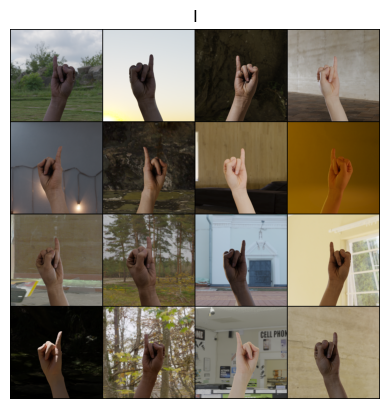

Figure saved ✅


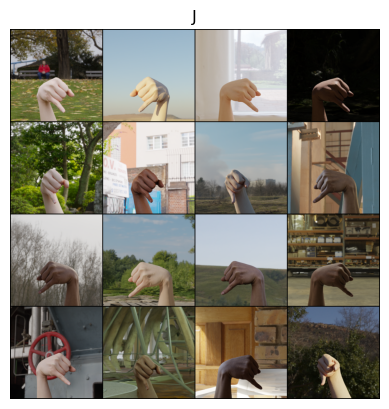

Figure saved ✅


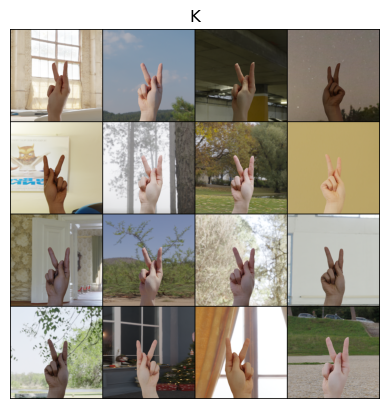

Figure saved ✅


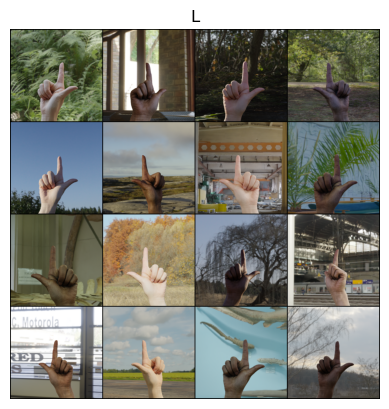

Figure saved ✅


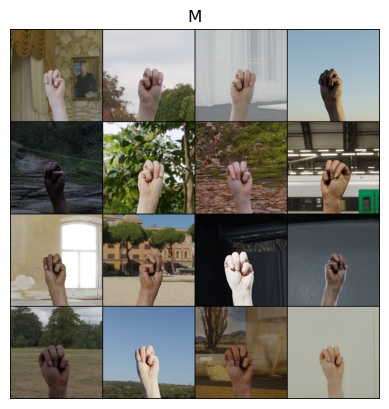

Figure saved ✅


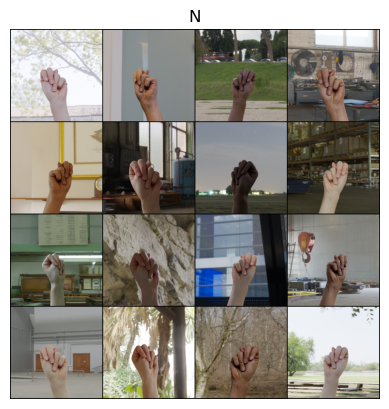

Figure saved ✅


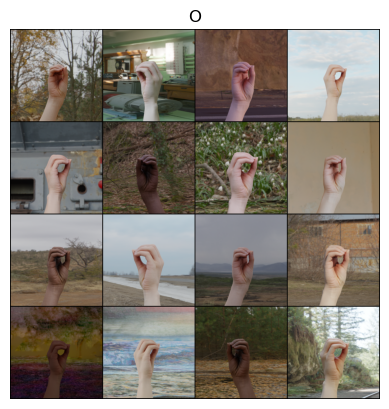

Figure saved ✅


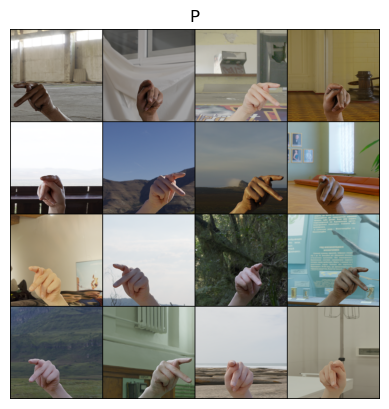

Figure saved ✅


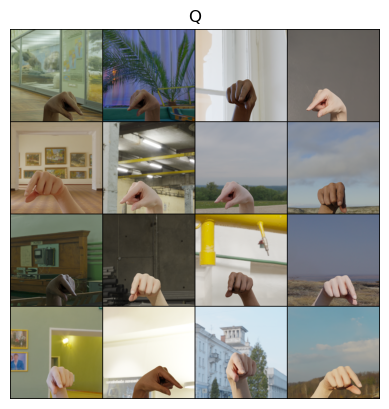

Figure saved ✅


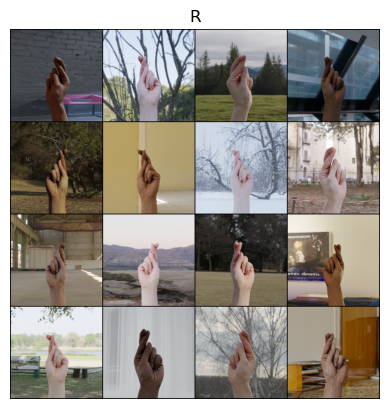

Figure saved ✅


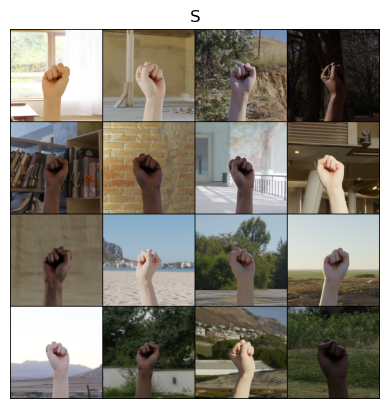

Figure saved ✅


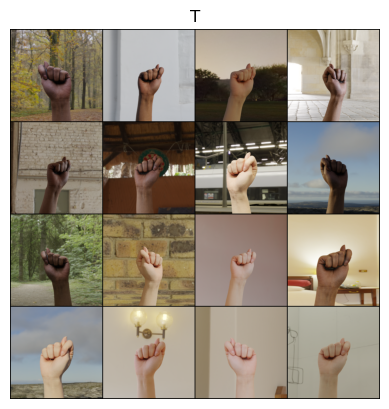

Figure saved ✅


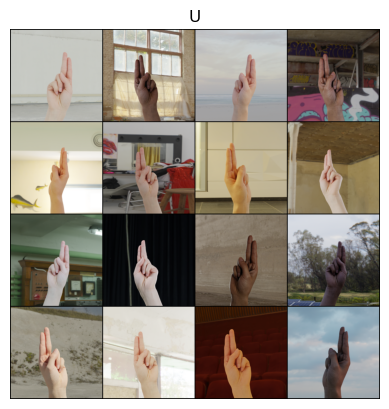

Figure saved ✅


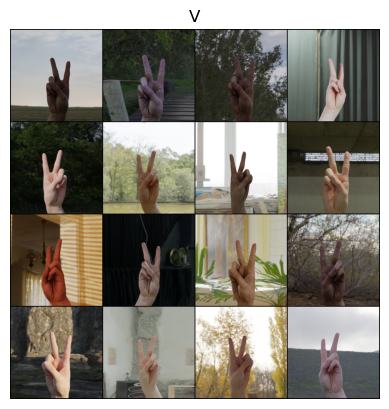

Figure saved ✅


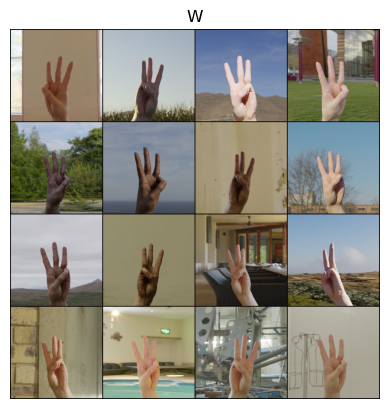

Figure saved ✅


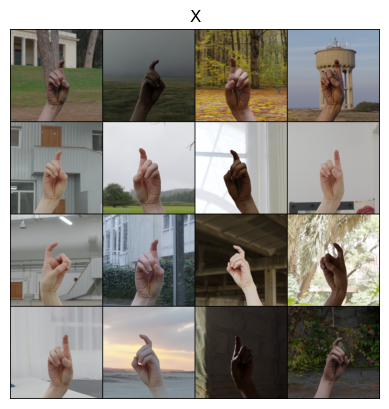

Figure saved ✅


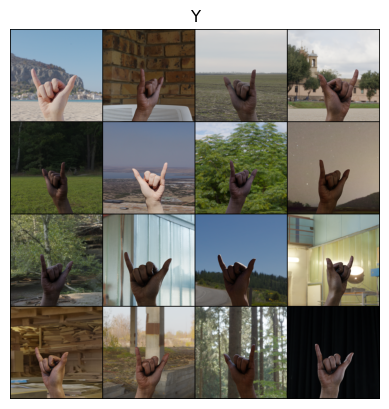

Figure saved ✅


In [20]:
n_images = 16
target_size = (224, 224)

for key, value in synthetic_train_filenames_dict.items():
    images = []
    random_images = get_random_images(value, n=n_images)
    
    for i in range(n_images):
        image_path = random_images[i]
        image = np.array(io.read_image(image_path, size=target_size))
        image = torch.from_numpy(image).permute(2, 0, 1)  # Convert to CxHxW format
        images.append(image)
        
    fig_title = f"Random {n_images} images of class '{key}'"
    fig = visualization.show_image_grid(images, ncols=4, title=key)
    fig_filename = os.path.join(reports_dir, f"random_{n_images}_images_{key}.png")
    visualization.save_figure(fig, fig_filename)